<a href="https://colab.research.google.com/github/Nateme16/geo-aquawatch-water-quality/blob/main/WQ%20algorithms/SOLID/SOLID%20in%20EE/Solid_Nate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  SOLID using S2_SR in EE while ACOLITE version is sorted


In [1]:
!pip install geemap --quiet

     |████████████████████████████████| 2.1 MB 5.2 MB/s 
     |████████████████████████████████| 3.7 MB 37.6 MB/s 
     |████████████████████████████████| 99 kB 4.1 MB/s 
     |████████████████████████████████| 98 kB 2.8 MB/s 
     |████████████████████████████████| 130 kB 24.8 MB/s 
     |████████████████████████████████| 46 kB 3.0 MB/s 
     |████████████████████████████████| 1.3 MB 52.8 MB/s 
     |████████████████████████████████| 3.5 MB 39.0 MB/s 
     |████████████████████████████████| 55 kB 3.2 MB/s 
     |████████████████████████████████| 198 kB 58.1 MB/s 
     |████████████████████████████████| 1.2 MB 43.8 MB/s 
     |████████████████████████████████| 128 kB 15.8 MB/s 
     |████████████████████████████████| 1.6 MB 63.4 MB/s 
     |████████████████████████████████| 79 kB 7.3 MB/s 


In [2]:
import geemap

In [3]:
Map = geemap.Map(center=[39.2226,-76.3007], zoom= 9)
Map

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=n29eKffwJesc1TqKa_dOTNXBhCwJu9RgakRi-hsi_PA&tc=z40c-Y1Bue5nEW8Uwb37vrpLWag97iYjjIRmXBFz_cM&cc=swLIuZrf5wOiQrYwGrGhS9v3dbZbdulg54O9urVFffI

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AWgavdc2qxHN_QuxK70iYJ81JnSRrkFBkRlBH5-vu23OIkY-VHxprvDcHFs

Successfully saved authorization token.


Map(center=[39.2226, -76.3007], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(ch…

Get one image and set up to get Rrs inputs from SR product

In [4]:

import ee
import math

#get rid of clouds and keep just the ater
#old s2 cloudmask and water, there is a different new one, but keeping it simple
def cloudmask(img):
                  mask = img.select(['SCL']).eq(6)
                  notcloud=img.select(['QA60']).eq(0)
                  img=img.updateMask(mask)
                  img=img.updateMask(notcloud)
                  return img

#get same image as Csaba
image= cloudmask(ee.Image('COPERNICUS/S2_SR/20200116T155609_20200116T155605_T18SUJ')) 
imageVisParam = {"opacity":1,"bands":["B4","B3","B2"],"min":-560.1588934829267,"max":2614.3187289464204,"gamma":1}
Map.addLayer(image,imageVisParam,"image")

# B4 - R(665)
# B3 - R(560)
# B2 - R(492)
# B6 - R(740)
# B1 - R(444)

#rescale (/10000), keep only useful bands, HERE IS WHERE I LOSE IMAGE PROPERTIES
def rescale_bands(img):
  img= img.select(["B4","B3","B2","B6","B1"]).multiply(.0001) #.copyProperties(img, img.propertyNames()) if you need the properties in image
  return img
  
image= rescale_bands(image)

#SR to Rrs. Could be many funcitons, this is the simplest one just divide by PI
def SRtoRrs(img):
  img=img.divide(ee.Number(math.pi))
  return img
image= SRtoRrs(image)

#Map.addLayer(image,imageVisParam,"Rrs")



Define water type based on logic from paper

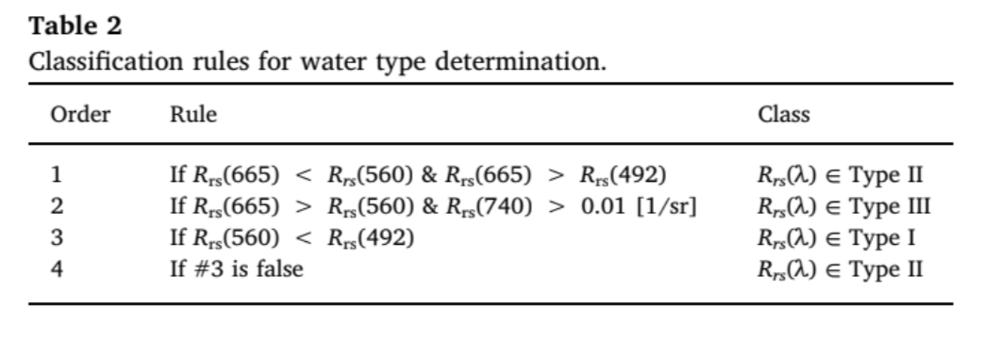


In [5]:
def watertype(img):  #get some eyes on the sequence of these logics in sequence fix TypeIV to II.$$
  b4 = img.select("B4")
  b3 = img.select("B3")
  b2 = img.select("B2")
  b6 = img.select("B6")
  
  typeII = b4.lt(b3).And(b4.gt(b2))
  typeIII= b4.gt(b3).And(b6.gt(.01)).And(typeII.eq(0)) 
  typeI = b3.lt(b2).And(typeIII.eq(0)).And(typeII.eq(0))
  typeII = b4.lt(b3).And(b4.gt(b2)).Or(b3.gte(b2).And(typeI.eq(0)).And(typeII.eq(0)).And(typeIII.eq(0)))

  return img.addBands([typeII.rename('typeII'),typeIII.rename('typeIII'),typeI.rename('typeI')])

image=watertype(image)

Map.addLayer(image,imageVisParam,"bands+watertype")

image_watertype=image.select(["typeII",'typeIII','typeI'])

Map.addLayer(image_watertype,[],"watertype")



Ok. Now lets make some functions to run in the various scenarios. Simple ones to start. These would be the TSS process(s) once we get those going for each different water type.

In [6]:

#IOP setup since MDN code uses these absrob and backscatter functions instead of constants.

import numpy as np
from scipy.interpolate import CubicSpline as Interpolate

from google.colab import drive

#import IOP from my google drive
#drive.mount('/content/drive/')
#aw=np.loadtxt('/content/drive/MyDrive/EE_Geo_Aquawatch/IOP/aw.txt',delimiter=",")
#bbw=np.loadtxt('/content/drive/MyDrive/EE_Geo_Aquawatch/IOP/bbw.txt',delimiter=",")

#import IOP strait from MDN Github
aw=np.loadtxt('https://raw.githubusercontent.com/BrandonSmithJ/MDN/master/IOP/aw',delimiter=",") #is there a better way to refernce this thing?
bbw=np.loadtxt('https://raw.githubusercontent.com/BrandonSmithJ/MDN/master/IOP/bbw',delimiter=",")

absorb  = Interpolate(*aw.T)
scatter = Interpolate(*bbw.T)

wavelengths=np.array([444,492,560,665])

test=absorb(441)
test2=float(test)

print(test)
#print(test2)

0.0067202476126535255


In [15]:

# functions adapted from: https://github.com/BrandonSmithJ/MDN/blob/master/benchmarks/tss/SOLID/model.py

#type 2 water

def typeII(img): #Where the MDN model call goes
  TSS=ee.Image(2).float().rename("TSS")
  return TSS

def typeIII(img): #single band NIR model

  #constants from MDN SOLID code
  e= 1.65
  f= 0.105
  c= 207.57
  d= 46.78
    
  ab= float(absorb(740))  # using 740 as upper band for MSI on Sentinel 2 
  sc= float(scatter(740)) 

  b6 = img.select("B6") #NIR band

  Rrs_NIR=b6
  bbp_NIR= image.expression(
    '(Rrs_NIR * (absorb + e + scatter) - scatter * f) / (f - Rrs_NIR)', {
      'Rrs_NIR': Rrs_NIR,
      'absorb': ab,
      'scatter':sc,
      'e': e,
      'f': f});

  TSS= image.expression(
    '(c * bbp_NIR - d)', {
      'c': c,
      'bbp_NIR': bbp_NIR,
      'd': d});

  return TSS.rename("TSS")


def typeI(img): #QAA model 

  #TSS=ee.Image(1).float().rename("TSS")
  # Constants and inputs

  # QAA
  g0_QAA = 0.08945
  g1_QAA = 0.1247  #pretty far off Darryls version?

  # SeaWiFS coefficients
  h0 = -1.14590292783408 
  h1 = -1.36582826429176
  h2 = -0.469266027944581 

  a_w= float(absorb(551))
  b_w= float(scatter(551))

  #Rrs to rrs- for all the bands
  Rrs=img
  rrs=img.expression(
    'Rrs / (.52 + 1.7*Rrs)', { #Lee et al 2002, https://github.com/BrandonSmithJ/MDN/blob/master/benchmarks/utils.py 
      'Rrs': Rrs});
  
  #rrs to u() for each band
  u=rrs.expression(
    '(-g0 + (g0**2 + 4 * g1 * rrs) ** 0.5) / (2 * g1) ', { #Lee et al 2002, https://github.com/BrandonSmithJ/MDN/blob/master/benchmarks/utils.py 
      'rrs': rrs,
      'g0': g0_QAA,
      'g1': g1_QAA
      });

  #QAA_v5 or QAA_v6 below. Two functions depending, so writing both than some sort of .where function

  def QAA_v5(rrs):

    b3 = rrs.select("B3") #lambda band
    b1 = rrs.select("B1")
    b2 = rrs.select("B2")
    b3 = rrs.select("B3")
    b4 = rrs.select("B4")

    ulambda=u.select("B3")

    chi=rrs.expression(
        ' (b1 + b2) / (b3 + 5 * (b4 / b2) * b4) ', { 
        'b1': b1,
        'b2': b2,
        'b3': b3,
        'b4': b4
        });

    chi=chi.log10().rename("chi")

    a = rrs.expression(
        ' a_w + 10 ** (h0 + h1 * chi + h2 * chi**2) ', { 
        'a_w': a_w,
        'h0': h0,
        'h1': h1,
        'h2': h2,
        'chi': chi
        });

    b = rrs.expression(
        ' (ulambda* a) / (1 - ulambda) - b_w  ', { 
        'ulambda': ulambda,
        'a': a,
        'b_w': b_w
        });

    a_full=a
    b_full=b
    l_full=b3

    return rrs.addBands([a_full.rename('a_full'),b_full.rename('b_full'),l_full.rename('l_full')])
    

  def QAA_v6(rrs):

    b3 = rrs.select("B3") #lambda band
    b1 = rrs.select("B1")
    b2 = rrs.select("B2")
    b3 = rrs.select("B3")
    b4 = rrs.select("B4")

    ulambda=u.select("B3")

    a = rrs.expression(
        ' a_w + 0.39 * ( b4 / (b1 +  b2) ) ** 1.14 ', { 
        'a_w': a_w,
        'b4': b4,
        'b1': b1,
        'b2': b2
        });

    b = rrs.expression(
        ' (ulambda * a) / (1 - ulambda) - b_w ', { 
        'ulambda': ulambda,
        'a': a,
        'b_w': b_w
        });
    
    a_full=a
    b_full=b
    l_full=b3

    return rrs.addBands([a_full.rename('a_full'),b_full.rename('b_full'),l_full.rename('l_full')])

  #logic for QAA 5 vs 6 on rrs image

  qaa= QAA_v5(rrs) #maybe could be more efficient then running 5 then 6.
  qaa = qaa.where(rrs.select("B4").gte(.0015), QAA_v6(rrs) )  #the constant from the MDN github

  #back to same for both scenarios
  a0 = qaa.select("a_full")
  b0 = qaa.select("b_full")
  l0 = qaa.select("l_full")
  
  b1 = rrs.select("B1")
  b3 = rrs.select("B3")
  
  eta = rrs.expression(
        ' 2 * (1 - 1.2 * e ** (-0.9 * b1 / b3))', { 
        'b1': b1,
        'b3': b3,
        'e' : ee.Number(math.e)
        });

  #probably could do these a and b with some sort of matrix function, but making it work for now
  wavelengths=[444,492,560,665] #check with Kelly on this and which exact numbers for the sensor or is this the closest sort of thing aagin?
  
  b_1=qaa.expression(
        ' b0 * (l0 / b_n) ** eta', { 
        'b0': b0,
        'l0': l0,
        'b_n' : wavelengths[0],
        'eta' : eta
        }).rename("b_1");

  b_2=qaa.expression(
        ' b0 * (l0 / b_n) ** eta', { 
        'b0': b0,
        'l0': l0,
        'b_n' : wavelengths[1],
        'eta' : eta
        });

  b_3=qaa.expression(
        ' b0 * (l0 / b_n) ** eta', { 
        'b0': b0,
        'l0': l0,
        'b_n' : wavelengths[2],
        'eta' : eta
        });

  b_4=qaa.expression(
        ' b0 * (l0 / b_n) ** eta', { 
        'b0': b0,
        'l0': l0,
        'b_n' : wavelengths[3],
        'eta' : eta
        });

  b = b_1.addBands([b_2.rename('b_2'),b_3.rename('b_3'),b_4.rename('b_4')])

#does not appear we need the rest of this for the QAA to TSS step, just this b

  # wavelengths_scatter=scatter(wavelengths) 

  # a_1=image.expression(
  #       '(1 - u) * (scatter_wavelengths + b) / u', { 
  #       'u': u.select("B1"),
  #       'b': b.select("b_1"),
  #       'scatter_wavelengths' : wavelengths_scatter[0]
  #       }).rename("a_1");

  # a_2=image.expression(
  #       '(1 - u) * (scatter_wavelengths + b) / u', { 
  #       'u': u.select("B2"),
  #       'b': b.select("b_2"),
  #       'scatter_wavelengths' : wavelengths_scatter[1]
  #       }).rename("a_2");

  # a_3=image.expression(
  #       '(1 - u) * (scatter_wavelengths + b) / u', { 
  #       'u': u.select("B3"),
  #       'b': b.select("b_3"),
  #       'scatter_wavelengths' : wavelengths_scatter[2]
  #       }).rename("a_3");

  # a_4=image.expression(
  #       '(1 - u) * (scatter_wavelengths + b) / u', { 
  #       'u': u.select("B4"),
  #       'b': b.select("b_4"),
  #       'scatter_wavelengths' : wavelengths_scatter[3]
  #       }).rename("a_4");

  # a = a_1.addBands([a_2.rename('a_2'),a_3.rename('a_3'),a_4.rename('a_4')]) 

  # #decompose absorption? not with S2 it seems

  # #remove negatives, not sure how to do this yet

  # #QAA-CDOM - Zhu & Yu 2013
  # a_p = image.expression(
  #       '0.63 * b ** 0.88', { 
  #       'b': b,
  #       });
  # #
  # a_g = image.expression(
  #       'a - absorb443 - a_p ', { 
  #       'a': a,
  #       'absorb443': float(absorb(443)),
  #       'a_p': a_p
  #       });

  a_f = 53.736 # Eq. 6
  b_f = 0.8559

  estimate = image.expression(
        'a_f * bbp_665 ** b_f', { 
        'a_f': a_f,
        'b_f': b_f,
        'bbp_665': b.select("b_4")
        }).rename("TSS"); 

  return estimate

test=typeI(image)
#print(test)



In [25]:
viz = {'min': 0, 'max': 50, 'palette': ['00FFFF', '0000FF']}
Map.addLayer(test,viz,"test")
Map

Map(bottom=50435.0, center=[38.91027022759443, -76.58020019531251], controls=(WidgetControl(options=['position…

Run the functions over images based on the conditional logic of which function for what pixel

In [28]:
def TSSit2(img): 

 replacementII=ee.Image(typeII(img)).select("TSS")
 replacementIII=ee.Image(typeIII(img)).select("TSS")
 replacementI=ee.Image(typeI(img)).select("TSS")
 
 TSS=img
 TSS = TSS.where(img.select("typeI").eq(1), replacementI) #MADE THESE ALL typeI to try it
 TSS = TSS.where(img.select("typeII").eq(1), replacementII)
 TSS = TSS.where(img.select("typeIII").eq(1), replacementIII)
 
 TSS= TSS.select("typeI").rename("TSS") #keeping just one of the bands. They all get replace each time "where" above.

 return TSS.select("TSS")

test=TSSit2(image)
viz = {'min': -100, 'max': 150, 'palette': ['00FFFF', '0000FF']}
Map.addLayer(test,viz,"TSSit2")


Apply to ImageCollection test. Get s2 sr imagery for Narragansett Bay region

In [29]:
import ee
NBay = ee.Geometry.Polygon(
        [[[-71.44643316430347, 41.92140472212022],
          [-71.53981695336597, 41.48257061731345],
          [-71.47939214867847, 41.3383770483458],
          [-71.16078863305347, 41.42699101424345],
          [-71.16095830370352, 41.64257191827559],
          [-70.97676763695972, 41.88869830740288],
          [-71.15111544654354, 41.97883748042962]]])

imageVisParam = {"opacity":1,"bands":["B4","B3","B2"],"min":-560.1588934829267,"max":2614.3187289464204,"gamma":1}

In [30]:
area=NBay
#Time window
startyear = 2020
endyear = 2020;
startmonth = 1
endmonth = 12

imageCollection = ee.ImageCollection("COPERNICUS/S2_SR")\
  .filterBounds(area)\
  .filter(ee.Filter.lt('HIGH_PROBA_CLOUDS_PERCENTAGE',10))\
  .filter(ee.Filter.calendarRange(startyear,endyear,'year'))\
  .filter(ee.Filter.calendarRange(startmonth,endmonth,'month'))\
  .sort('system:time_start')\
  .set('SENSOR_ID', 'OLI_TIRS')

#old s2 cloudmask and water, there is a different new one, but keeping it simple
def cloudmask(img):
                  mask = img.select(['SCL']).eq(6)
                  notcloud=img.select(['QA60']).eq(0)
                  img=img.updateMask(mask)
                  img=img.updateMask(notcloud)
                  return img

imageCollection = imageCollection.map(cloudmask)

#Map.addLayer(imageCollection.median(),imageVisParam,"result1")

# the functions that make up the process, seperate for now for debug
imageCollection=imageCollection.map(rescale_bands)
imageCollection=imageCollection.map(SRtoRrs)
imageCollection=imageCollection.map(watertype)
TSS_imagecollection=imageCollection.map(TSSit2)


In [32]:
Map.addLayer(TSS_imagecollection.first(),viz,"TSS_collection")